## Detecting Cancer Metastases on Gigapixel Pathology Images

In [1]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 34 not upgraded.
Need to get 92.5 kB of archives.
After this operation, 268 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libopenslide0 amd64 3.4.1+dfsg-2 [79.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 openslide-tools amd64 3.4.1+dfsg-2 [12.7 kB]
Fetched 92.5 kB in 1s (152 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 160690 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-2

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import tensorflow as tf

from openslide import open_slide, __library_version__ as openslide_version
import cv2
from PIL import Image
from skimage.color import rgb2gray

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random

import os
import glob
import shutil


from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, concatenate, Input, Dense, Dropout, BatchNormalization, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc

### 1. Import the slide dataset

In [3]:
input_dir = '/content/drive/MyDrive/2021Spring/slides_copy/'
mask_dir, slide_dir  = [],[]
mask_ID,  slide_ID   = [],[]

# loop through the data directory, and split the masks & slides
for item in os.listdir(input_dir): 
  # remove the 'Copy of' string 
  if 'Copy of' in item:
      new_name = item.split(' ')[-1]
      os.rename(input_dir+item,input_dir+new_name)
      item = new_name  

  if item.endswith('.tif'):
    if 'mask' in item:
      mask_ID.append(item.split('_')[1])
      mask_dir.append(item)
    else:
      slide_ID.append(item.split('_')[1].split('.')[0])
      slide_dir.append(item)

# mask_dir,slide_dir, slide_ID = sorted(mask_dir), sorted(slide_dir), sorted(slide_ID)


print('The mask directory contiains %d item'%len(mask_ID))
print('The slide directory contiains %d item'%len(slide_ID))

# to check which slide does not have corresponding mask
print('ID of the missing mask: ',set(slide_ID).difference(mask_ID))
# Therefore, we remove the 'tumor_038.tif' from slide_dir list
slide_dir.remove('tumor_038.tif')

The mask directory contiains 21 item
The slide directory contiains 22 item
ID of the missing mask:  {'038'}


verification

In [ ]:
# further verification
assert len(slide_dir) == len(mask_dir)

# Verify downsampling works as expected
for (slide_path,mask_path) in zip(slide_dir,mask_dir):
  # slide       = open_slide(input_dir+slide_path)
  tumor_mask  = open_slide(input_dir+mask_path)

  width, height = slide.level_dimensions[7]
  assert width * slide.level_downsamples[7] == slide.level_dimensions[0][0]
  assert height * slide.level_downsamples[7] == slide.level_dimensions[0][1]

  print(slide_path,mask_path)


Slide visualization

In [5]:
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

In [ ]:
slide_path = 'tumor_078.tif'
mask_path  = 'tumor_078_mask.tif'

slide       = open_slide(input_dir+slide_path)
tumor_mask  = open_slide(input_dir+mask_path)

slide_image = read_slide( slide, 
                          x=0, 
                          y=0, 
                          level=5, 
                          width=slide.level_dimensions[5][0], 
                          height=slide.level_dimensions[5][1])

mask_image = read_slide(tumor_mask, 
                        x=0, 
                        y=0, 
                        level=5, 
                        width=tumor_mask.level_dimensions[5][0], 
                        height=tumor_mask.level_dimensions[5][1])

mask_image = mask_image[:,:,0]


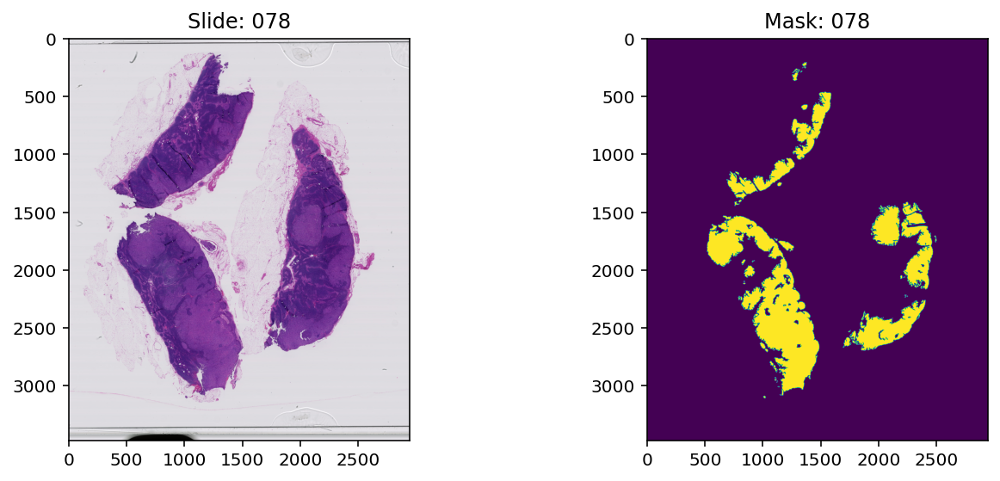

In [ ]:
fig, axes = plt.subplots(figsize=(10,4),ncols=2)

axes[0].imshow(slide_image)
axes[1].imshow(mask_image)

axes[0].set_title("Slide: " + mask_path.split('_')[1])
axes[1].set_title("Mask: " + mask_path.split('_')[1])

plt.tight_layout()
plt.rcParams['savefig.dpi'] = 310
# plt.savefig('/content/drive/MyDrive/2021Spring/DL_project/Figures/raw_dataset_visual.jpg')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


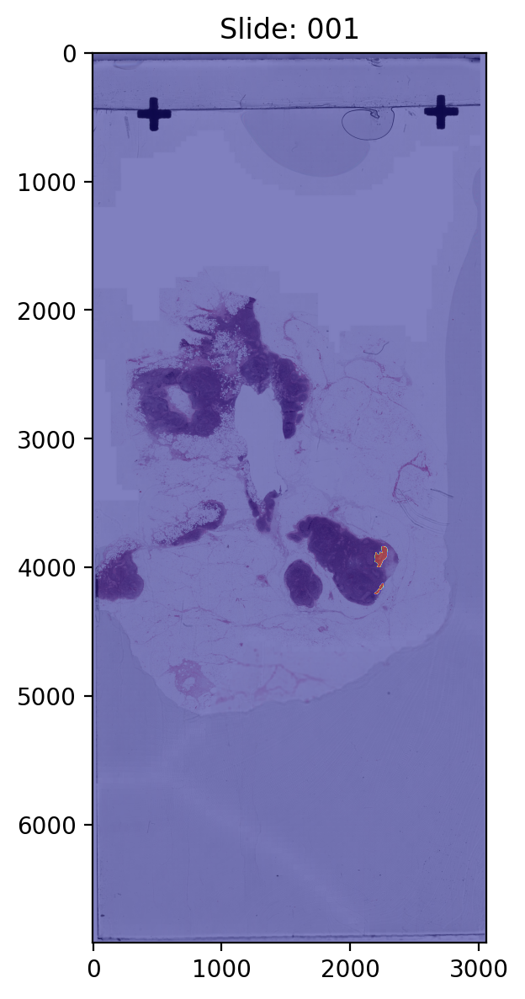

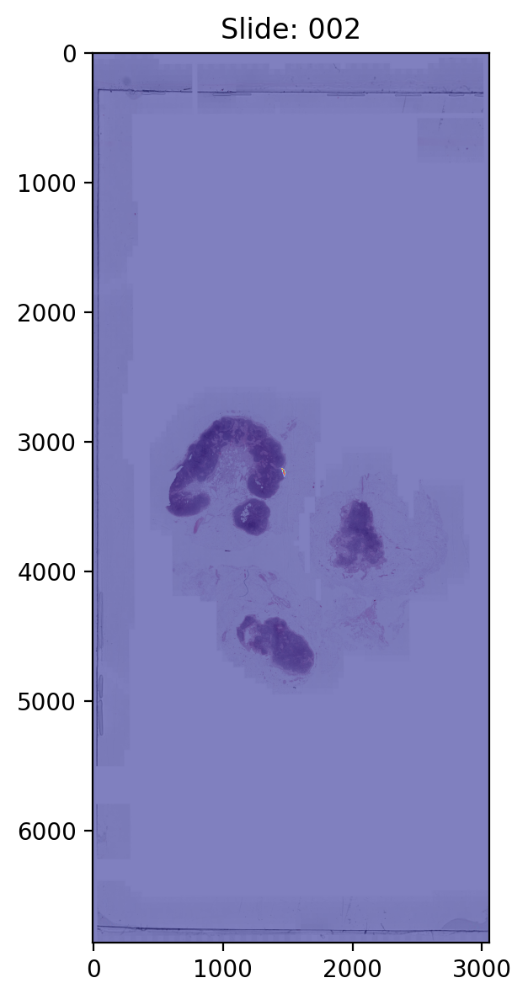

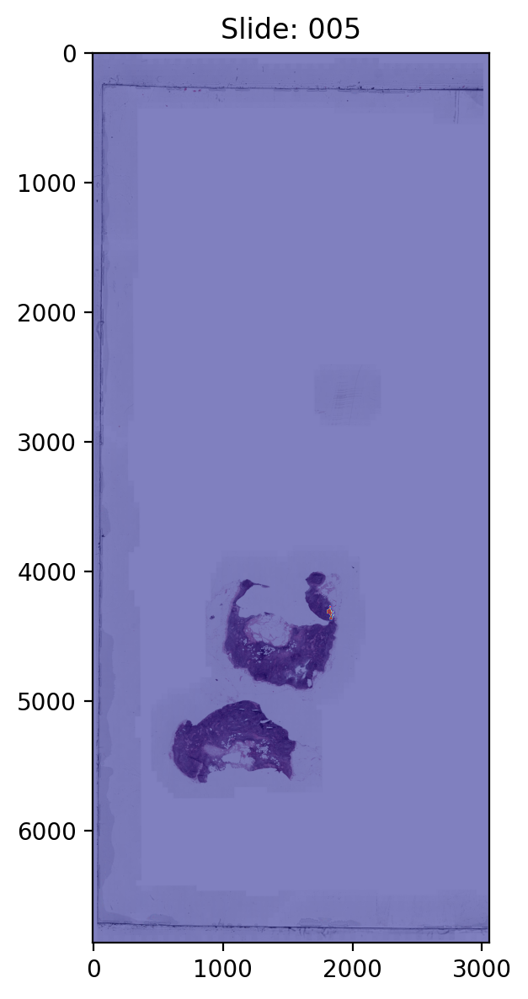

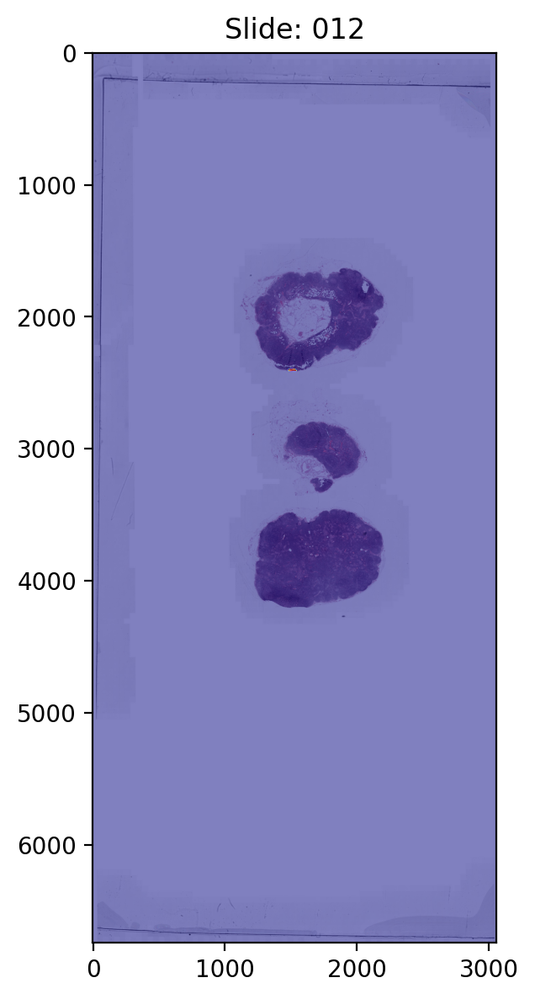

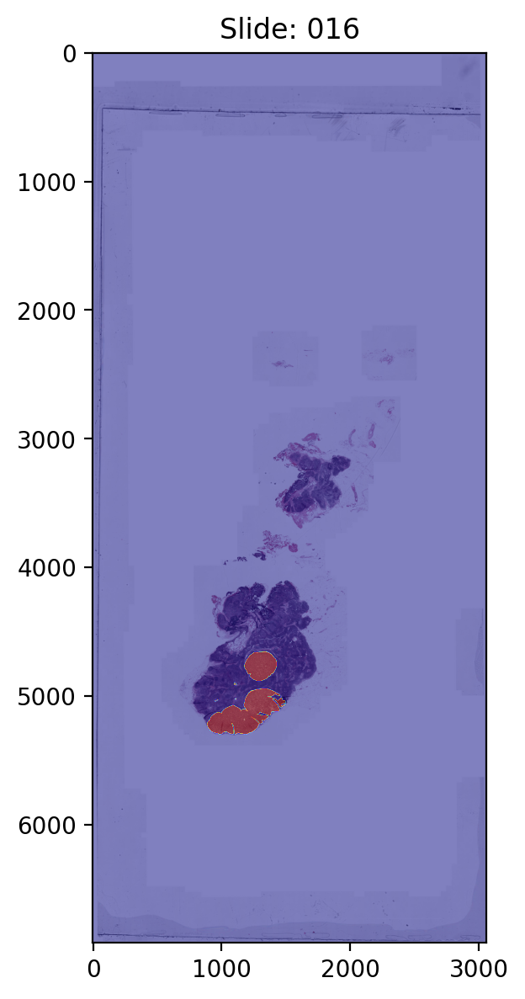

...

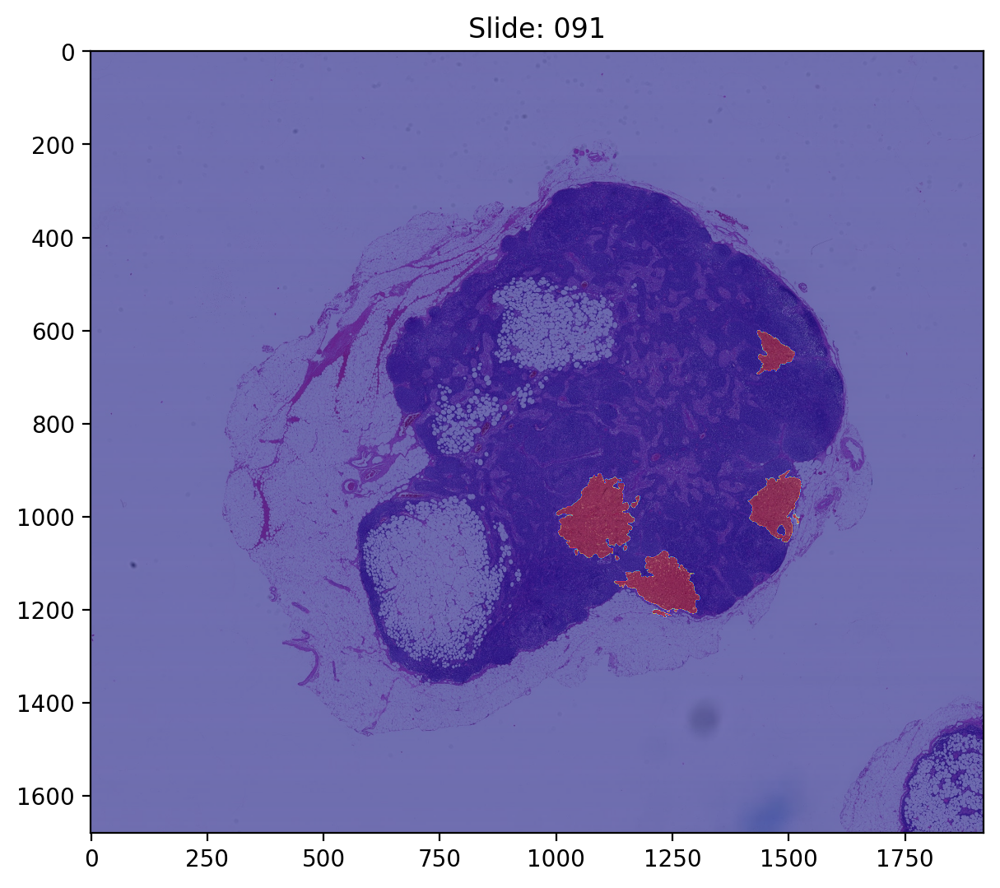

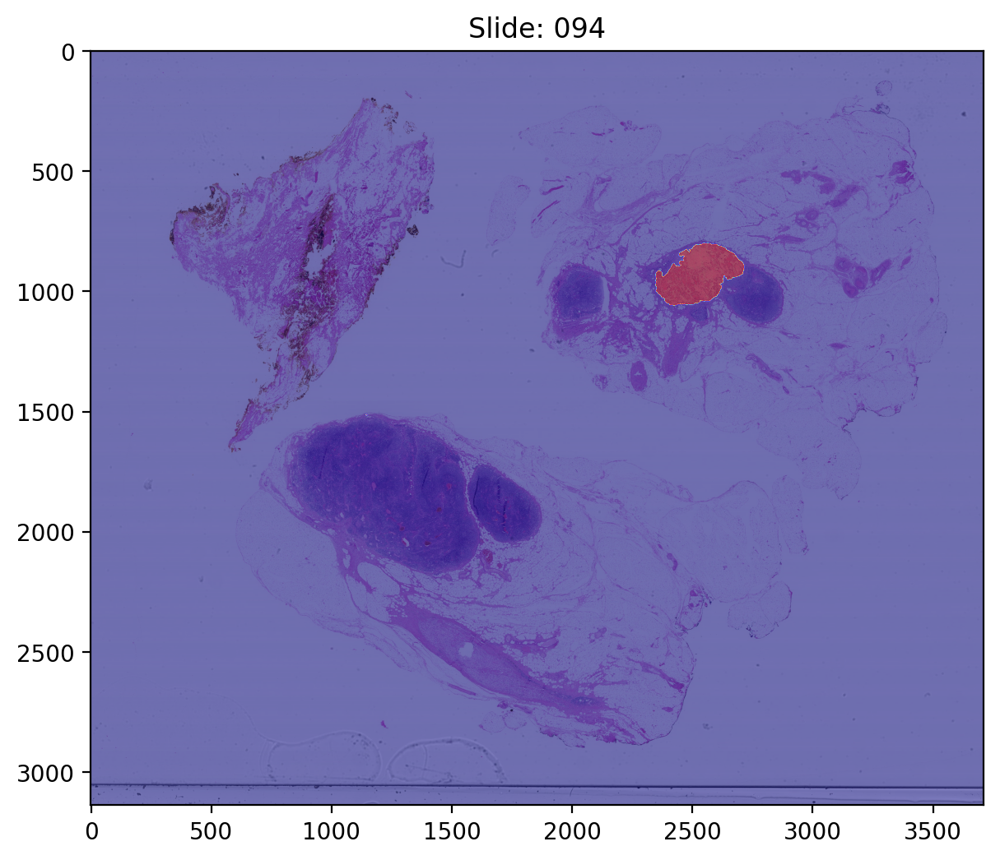

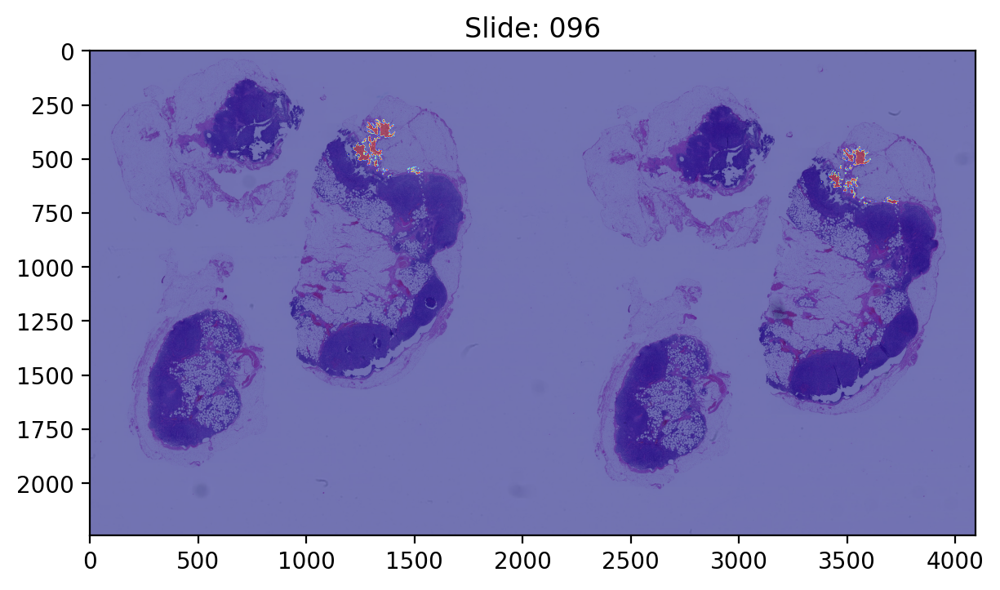

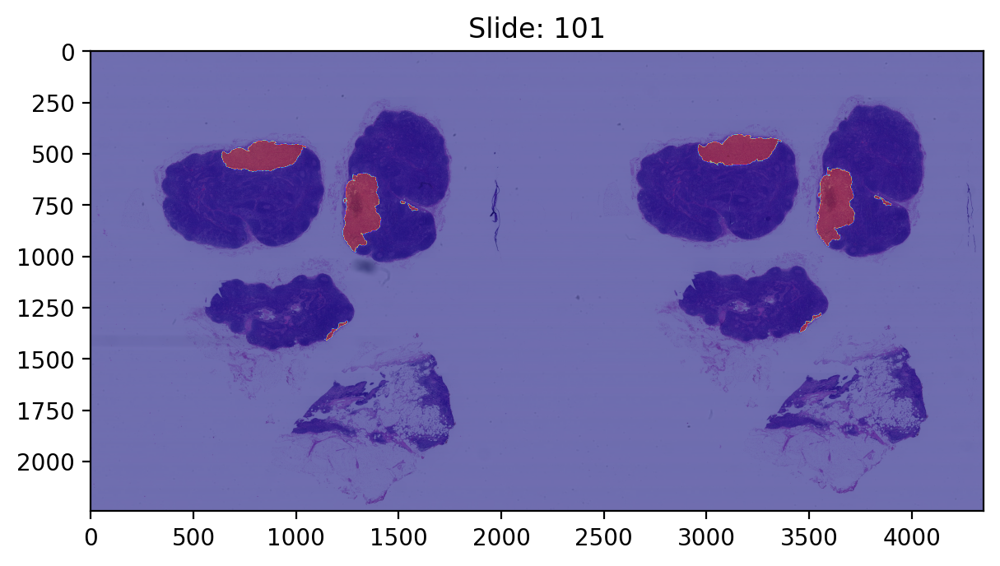

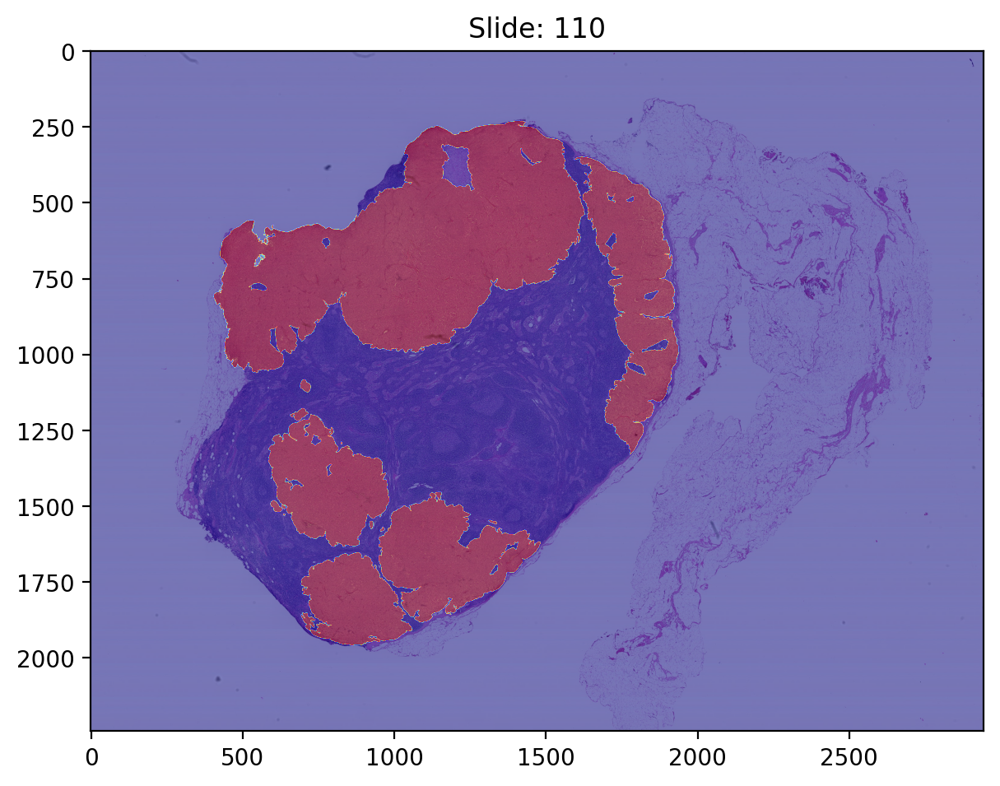

In [ ]:
for (slide_path,mask_path) in zip(slide_dir,mask_dir):
  
  slide       = open_slide(input_dir+slide_path)
  tumor_mask  = open_slide(input_dir+mask_path)

  slide_image = read_slide( slide, 
                            x=0, 
                            y=0, 
                            level=5, 
                            width=slide.level_dimensions[5][0], 
                            height=slide.level_dimensions[5][1])
  
  mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=5, 
                          width=tumor_mask.level_dimensions[5][0], 
                          height=tumor_mask.level_dimensions[5][1])
  
  mask_image = mask_image[:,:,0]
  
  plt.figure(figsize=(7, 7), dpi=100)
 
  plt.imshow(slide_image)
  plt.imshow(mask_image, cmap='jet', alpha=0.5) # Red regions contains cancer
  plt.title("Slide: " + mask_path.split('_')[1])
  # break



### 2. select slides for training and validation sets


In [5]:
normal_slide = []
cancer_slide = []
for (i,mask_path) in enumerate(mask_dir):
  tumor_mask  = open_slide(input_dir+mask_path)
  
  mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=5, 
                          width=tumor_mask.level_dimensions[5][0], 
                          height=tumor_mask.level_dimensions[5][1])
  
  mask_image = mask_image[:,:,0]
  
  if mask_image.sum() == 0:
    normal_slide.append(mask_path)
  else:
    cancer_slide.append(mask_path)

print('The number of cancer slides is ', len(cancer_slide))
print('The number of normal slides is ', len(normal_slide))


The number of cancer slides is  21
The number of normal slides is  0


In [6]:
train_ID = ['016', '019', '031', '064', '075', '078', '084', '094', '101'] # 
valid_ID = ['091'] 

train_slide_dir, valid_slide_dir = [], []
for item in slide_dir:

  ID = item.split('_')[1].split('.')[0]
  if ID in train_ID:
    train_slide_dir.append(item)
  if ID in valid_ID:
    valid_slide_dir.append(item)
    
train_mask_dir, valid_mask_dir = [], []
for item in mask_dir:

  ID = item.split('_')[1]
  if ID in train_ID:
    train_mask_dir.append(item)
  if ID in valid_ID:
    valid_mask_dir.append(item)

In [7]:
train_val_test = {}
train_val_test['Training']   = (train_slide_dir,train_mask_dir)
train_val_test['Validation'] = (valid_slide_dir,valid_mask_dir)


### 3. Create patches


In [8]:
# ignoring non-tissue areas
def find_tissue_pixels(image, intensity=0.8):
  """
  To find the locations of tissue pixels
  """
  im_gray = rgb2gray(image)
  assert im_gray.shape == (image.shape[0], image.shape[1])
  indices = np.where(im_gray <= intensity)
  return list(zip(indices[0], indices[1]))


def apply_mask(im, mask, color=(255,0,0)):
  """
  Apply the mask to ignore non-tissue areas & show tissue areas in red color
  """
  masked = np.copy(im)
  for x,y in mask: 
    masked[x][y] = color

  return masked

def get_tissue_percentage(images, patch_shape = 299):
  """
  Calculate the percentage of tissue part
  """

  tissue_pixels = find_tissue_pixels(images)
  tissue_percent = float(len(list(tissue_pixels))) / patch_shape**2 * 100
  return tissue_percent


def create_output_dir(output_dir):
  """
  create the output directory if it doesn't exist
  """

  if os.path.exists(output_dir):
    print("Output folder already exists")
  else:
    print("Creating an output directory")
    os.makedirs(output_dir)

def center_tumor_check(mask, center_size = 128, patch_shape = 299):
  """
  Check whether the cancer cell exists at the center of the patch
  reference: https://github.com/YC-Coder-Chen/Detecting-Cancer-on-Gigapixel-Images/blob/master/NB1_Data_Cleaning.ipynb 
  """
  
  gap = (patch_shape - center_size) // 2
  center_region = mask[gap : gap + center_size, gap : gap + center_size]
  return np.sum(center_region) > 0


def get_patch(slide, tumor_mask, x, y, zoom_level, patch_shape = 299):
  """
  select the patch based on its center coordicate (x,y)
  reference: https://github.com/YC-Coder-Chen/Detecting-Cancer-on-Gigapixel-Images/blob/master/NB1_Data_Cleaning.ipynb
  """

  x = int(x) 
  y = int(y)

  gap = int(patch_shape //2 * slide.level_downsamples[zoom_level])
    
  slide_image = read_slide(slide, 
                           x - gap, 
                           y - gap, 
                           zoom_level, 
                           width=patch_shape, 
                           height=patch_shape)
  mask_image = read_slide(tumor_mask, 
                          x - gap, 
                          y - gap, 
                          zoom_level, 
                          width=patch_shape, 
                          height=patch_shape)
  mask_image = mask_image[:, :, 0]
  
  return slide_image, mask_image

#### Create patches for negative&positive samples

Create patches at multiple zoom, save each patch as a single .jpg file

In [9]:
def slide_window_extraction(dataset,zoom_levels,patch_shape=299, tissue_shreshold = 30):

  """
  Inputs:

  dataset:          to indicate patches for training/validation/test set
  zoom_levels:      multiple zoom levels at which patches are extracted
  patch_shape:      shape of the generated patch
  tissue_shreshold: shreshold of the tissue percentage

  Outputs:
  n_pos_total:      number of all positive patches
  n_neg_total:      number of all negative patches
  zoom_low_result:  all patches at zoom level 1 (low resolution) 
  zoom_high_result: all patches at zoom level 2 (high resolution)
  labels:           labels corresponding to all patches
  """

  zoom_level_low  = max(zoom_levels) # low resolution
  zoom_level_high = min(zoom_levels) # high resolution

  # create the output directory for negative & positive cases respectively
  neg_dir_low  = f'/content/drive/MyDrive/2021Spring/DL_project/{dataset}/level_{zoom_level_low}_option1/negative/'
  pos_dir_low  = f'/content/drive/MyDrive/2021Spring/DL_project/{dataset}/level_{zoom_level_low}_option1/positive/'
  create_output_dir(neg_dir_low)
  create_output_dir(pos_dir_low)

  neg_dir_high  = f'/content/drive/MyDrive/2021Spring/DL_project/{dataset}/level_{zoom_level_high}_option1/negative/'
  pos_dir_high  = f'/content/drive/MyDrive/2021Spring/DL_project/{dataset}/level_{zoom_level_high}_option1/positive/'
  create_output_dir(neg_dir_high)
  create_output_dir(pos_dir_high)

  # count the total number of positive & negative samples
  n_pos_total = 0
  n_neg_total = 0

  labels          = []
  zoom_low_result = []
  zoom_high_result = []


  # input directories (training, test , or validation)
  input_slide_dir,input_mask_dir = train_val_test[dataset]

  # Start to extract the patches: 
  for (slide_path,mask_path) in zip(input_slide_dir,input_mask_dir):

    
    slide       = open_slide(input_dir+slide_path)
    tumor_mask  = open_slide(input_dir+mask_path)

    zoom_width, zoom_height = slide.level_dimensions[zoom_level_high]

    zoom_level1_factor = slide.level_downsamples[zoom_level_high] # high resolution
    zoom_level2_factor = slide.level_downsamples[zoom_level_low] # low resolution


    num_patch_width  = int((zoom_width - patch_shape * zoom_level2_factor) // (patch_shape))
    num_patch_height = int((zoom_height - patch_shape * zoom_level2_factor) // (patch_shape))
    
    # slide the window along vertical & horizontal directions
    for n_hor in range(num_patch_width):
      for n_ver in range(num_patch_height):
      
        # (x,y) coordinate in the level0 reference frame
        x = (patch_shape // 2 * zoom_level2_factor) + n_hor * patch_shape * zoom_level1_factor
        y = (patch_shape // 2 * zoom_level2_factor) + n_ver * patch_shape * zoom_level1_factor
    

        # read the patches and masks
        patch_image_high, patch_mask_high = get_patch(slide, tumor_mask, x, y, zoom_level_high, patch_shape) # high resolution
        patch_image_low, patch_mask_low = get_patch(slide, tumor_mask, x, y, zoom_level_low, patch_shape) # low resolution

        # only focus on the tissue region, the patch should have tissue percentage ≥ threshold
        tissue_percent = get_tissue_percentage(patch_image_high, patch_shape = 299)
        tissue_pixels  = find_tissue_pixels(patch_image_high)

        if tissue_percent >= tissue_shreshold:
          # check whether the extracted patch contains cancer cell
          
          mask_tissue = [patch_mask_high[pixels] for pixels in tissue_pixels]
          mask_tissue = np.array(mask_tissue)
          
          # positive case (no cancer cell)
          if mask_tissue.sum() != 0: 
            
            cv2.imwrite(pos_dir_high + f'pos_{n_pos_total}.jpg', patch_image_high)
            cv2.imwrite(pos_dir_low + f'pos_{n_pos_total}.jpg', patch_image_low)

            n_pos_total += 1
            labels.append(1) 
            zoom_low_result.append(patch_image_high)
            zoom_high_result.append(patch_image_high)

          # negative cases
          else:

            cv2.imwrite(neg_dir_high + f'neg_{n_neg_total}.jpg', patch_image_high)
            cv2.imwrite(neg_dir_low + f'neg_{n_neg_total}.jpg',  patch_image_low)

            n_neg_total += 1
            labels.append(0) 
            zoom_low_result.append(patch_image_low)
            zoom_high_result.append(patch_image_high)

    # print(f'Finished the extraction of {slide_path}, totally get {n_pos_total} positive patches and {n_neg_total} negative patches.')
  return n_pos_total, n_neg_total, zoom_low_result, zoom_high_result, labels

In [ ]:
valid_pos_total, valid_neg_total, valid_zoom_low_result, valid_zoom_high_result, valid_labels = slide_window_extraction(dataset='Validation',
                                                                                                                        zoom_levels=[2,3],
                                                                                                                        patch_shape=299, 
                                                                                                                        tissue_shreshold = 30)

In [ ]:
train_pos_total, train_neg_total, train_zoom_low_result, train_zoom_high_result, train_labels = slide_window_extraction(dataset='Training',
                                                                                                                        zoom_levels=[2,3],
                                                                                                                        patch_shape=299, 
                                                                                                                        tissue_shreshold = 30)

#### save the generated patches as .npy files


combine the generated patches (jpg files) in to one npy file.

In [ ]:
def combine_jpg2_npy(dataset,zoom_levels,category,option='option1'):

  """
  Combine all jpg files in one set into one np.array
  
  Inputs

  dataset:     to indicate training/validation/test set
  zoom_levels: multiple zoom levels at which patches are extracted
  category:    category of patches, i.e., negative or positive)

  Outputs
  n_images_low: number of all low-resolution images (Note: it equals to the number of all high-resolution images)
  images_low:   low-resolution images
  images_high:  high-resolution images
  labels:       labels corresponding to images
  """
  
  input_dir_low  = f'/content/drive/MyDrive/2021Spring/DL_project/{dataset}/level_{max(zoom_levels)}_'+option+f'/{category}/'
  input_dir_high = f'/content/drive/MyDrive/2021Spring/DL_project/{dataset}/level_{min(zoom_levels)}_'+option+f'/{category}/'

  # low resolution
  images_low = []
  for i in range(len(os.listdir(input_dir_low))): 
    
    if category == 'negative':
      item_dir= input_dir_low + f'neg_{i}.jpg'
    else:
      item_dir= input_dir_low + f'pos_{i}.jpg'

    image = cv2.imread(item_dir)
    images_low.append(image)

  images_low   = np.array(images_low)
  n_images_low = images_low.shape[0]

  # high resolution
  images_high = []
  for i in range(len(os.listdir(input_dir_high))): 
    
    if category == 'negative':
      item_dir= input_dir_high + f'neg_{i}.jpg'
    else:
      item_dir= input_dir_high + f'pos_{i}.jpg'

    image = cv2.imread(item_dir)
    images_high.append(image)

  images_high   = np.array(images_high)
  n_images_high = images_high.shape[0]

  assert n_images_low == n_images_high
  
  # obtain the true labels
  if category == 'positive':
    labels = np.ones(shape=(n_images_low,))

  else:
    labels = np.zeros(shape=(n_images_low,))

  return n_images_low, images_low, images_high, labels

In [ ]:
valid_neg_total, valid_zoom_low_neg, valid_zoom_high_neg, valid_neg_labels = combine_jpg2_npy('Validation',[2,3],'negative')
valid_pos_total, valid_zoom_low_pos, valid_zoom_high_pos, valid_pos_labels = combine_jpg2_npy('Validation',[2,3],'positive')

In [ ]:
train_neg_total, train_zoom_low_neg, train_zoom_high_neg, train_neg_labels = combine_jpg2_npy('Training',[2,3],'negative')
train_pos_total, train_zoom_low_pos, train_zoom_high_pos, train_pos_labels = combine_jpg2_npy('Training',[2,3],'positive')

In [ ]:
def saving_outputs(data_dir, dataset, 
                   zoom_level_low_neg, zoom_level_high_neg, labels_neg, 
                   zoom_level_low_pos, zoom_level_high_pos, labels_pos, 
                   input_list = False,option='option1'):
  """
  Save the np.array generated at the last step into .npy files

  Inputs:
  data_dir:            directory of input data 
  dataset:             to indicate training/validation/test sets
  zoom_level_low_neg:  negative low-resolution patches 
  zoom_level_high_neg: negative high-resolution patches 
  labels_neg:          labels of negative patches
  zoom_level_low_pos:  positive low-resolution patches 
  zoom_level_high_pos: positive high-resolution patches 
  labels_pos:          labels of positive patches 
  input_list:          to indicate the input variables are in form of "list" or "np.array"
  """

  if input_list:
    labels_neg = np.array(labels_neg)
    labels_pos = np.array(labels_pos)
    zoom_level_low_neg = np.array(zoom_level_low_neg)
    zoom_level_low_pos = np.array(zoom_level_low_pos)
    zoom_level_high_neg = np.array(zoom_level_high_neg)
    zoom_level_high_pos = np.array(zoom_level_high_pos)


  np.save(data_dir +  f'{dataset}/zoom_level_low'+option+'.npy',  np.concatenate([zoom_level_low_neg,zoom_level_low_pos]))
  del zoom_level_low_neg, zoom_level_low_pos
  np.save(data_dir +  f'{dataset}/zoom_level_high'+option+'.npy', np.concatenate([zoom_level_high_neg,zoom_level_high_pos]))
  del zoom_level_high_neg,zoom_level_high_pos
  np.save(data_dir +  f'{dataset}/labels'+option+'.npy', np.concatenate([labels_neg,labels_pos]))
  del labels_neg,labels_pos

In [ ]:
data_dir = '/content/drive/MyDrive/2021Spring/DL_project/'

saving_outputs( data_dir, 'Validation', 
                zoom_level_low_neg  = valid_zoom_low_neg, 
                zoom_level_high_neg = valid_zoom_high_neg, 
                labels_neg          = valid_neg_labels, 
                zoom_level_low_pos  = valid_zoom_low_pos, 
                zoom_level_high_pos = valid_zoom_high_pos, 
                labels_pos          = valid_pos_labels)

In [ ]:
saving_outputs( data_dir = '/content/drive/MyDrive/2021Spring/DL_project/', 
                dataset  = 'Training', 
                zoom_level_low_neg  = train_zoom_low_neg, 
                zoom_level_high_neg = train_zoom_high_neg, 
                labels_neg          = train_neg_labels, 
                zoom_level_low_pos  = train_zoom_low_pos, 
                zoom_level_high_pos = train_zoom_high_pos, 
                labels_pos          = train_pos_labels)

### 4. Mitigate the data imbalance issue

Firstly, read data for training set and validation set

In [13]:
saving_path = '/content/drive/MyDrive/2021Spring/DL_project'

option = 'option1'


val_zoom_low  = np.load(os.path.join(saving_path, 'Validation') + '/zoom_level_low'+option+'.npy')
val_zoom_high = np.load(os.path.join(saving_path, 'Validation') + '/zoom_level_high'+option+'.npy')
val_label = np.load(os.path.join(saving_path, 'Validation') + '/labels'+option+'.npy')

In [ ]:
train_zoom_low  = np.load(os.path.join(saving_path, 'Training') + '/zoom_level_low'+option+'.npy')
train_zoom_high = np.load(os.path.join(saving_path, 'Training') + '/zoom_level_high'+option+'.npy')
train_label = np.load(os.path.join(saving_path, 'Training') + '/labels'+option+'.npy')


To alleviate the data imbalance issue, we randomly select a subset of negative samples to decrease its size

In [14]:
def decrease_neg_samples(zoom_low,zoom_high,label):

  """
  To randomly decrease the size of negative samples

  Inputs:
  zoom_low:  low-resolution images
  zoom_high: high-resolution images
  label:     true labels 

  Outputs:
  zoom_low:  reduced low-resolution images (contains both positive&negative samples)
  zoom_high: reduced high-resolution images (contains both positive&negative samples)
  label:     reduced true labels (contains both positive&negative samples)
  """

  zoom_low_neg,  zoom_low_pos  = zoom_low[label == 0],  zoom_low[label == 1]
  zoom_high_neg, zoom_high_pos = zoom_high[label == 0], zoom_high[label == 1]

  assert zoom_low_neg.shape[0] == zoom_high_neg.shape[0]
  del zoom_low, zoom_high

  # randomly select 20% negative cases
  np.random.seed(0)
  index = np.random.choice(zoom_low_neg.shape[0], size = int(0.2*zoom_low_neg.shape[0]),replace=False)

  zoom_low_neg  = zoom_low_neg[index]
  zoom_high_neg = zoom_high_neg[index]

  # generate the reduced dataset
  zoom_low  = np.concatenate([zoom_low_neg, zoom_low_pos])
  zoom_high = np.concatenate([zoom_high_neg,zoom_high_pos])
  label    = np.concatenate([np.zeros(zoom_low_neg.shape[0],),np.ones(zoom_low_pos.shape[0],)])

  print(f'There are {zoom_low_neg.shape[0]} negative samples and {zoom_low_pos.shape[0]} positive samples')
  del zoom_low_neg, zoom_low_pos, zoom_high_neg,zoom_high_pos

  return zoom_low, zoom_high, label 
  

To alleviate the data imbalance issue, we also apply data augmentation for the positive samples

In [15]:
from scipy.ndimage import rotate

def augment_pos_samples(zoom_low,zoom_high,label,flip=True,rotation=False):

  """
  To augment positive samples by flip & rotation

  Inputs:
  zoom_low:  low-resolution images
  zoom_high: high-resolution images
  label:     true labels 

  Outputs:
  zoom_high_pos_aug: augmented high-resolution images (NO negative samples, only contains augmented positive samples)
  zoom_low_pos_aug:  augmented low-resolution images (NO negative samples, only contains augmented positive samples)
  label_aug:         augmented labels (NO negative samples, only contains augmented positive labels)
  """

  zoom_low_pos  = zoom_low[label == 1]
  zoom_high_pos = zoom_high[label == 1]

  zoom_high_pos_aug = []
  zoom_low_pos_aug  = []

  if flip:
    for patch_high,patch_low in zip(zoom_high_pos,zoom_low_pos):

      zoom_high_pos_aug.append(np.flip(patch_high,axis=1))
      zoom_low_pos_aug.append(np.flip(patch_low,axis=1))
  
  if rotation:
    for patch_high,patch_low in zip(zoom_high_pos,zoom_low_pos):

      zoom_high_pos_aug.append(rotate(patch_high,90))
      zoom_low_pos_aug.append(rotate(patch_low,90))
  
  zoom_high_pos_aug = np.array(zoom_high_pos_aug)
  zoom_low_pos_aug  = np.array(zoom_low_pos_aug)

  label_aug = np.ones((zoom_high_pos_aug.shape[0],))

  return zoom_high_pos_aug, zoom_low_pos_aug, label_aug



decrease the sample of negative cases

In [ ]:
val_zoom_low, val_zoom_high, val_label = decrease_neg_samples(val_zoom_low, val_zoom_high, val_label)

In [ ]:
train_zoom_low, train_zoom_high, train_label = decrease_neg_samples(train_zoom_low, train_zoom_high, train_label)

Increase the sample of positive cases (only for the training set)

In [ ]:
train_zoom_high_pos_aug, train_zoom_low_pos_aug, train_label_aug = augment_pos_samples(train_zoom_low,train_zoom_high,train_label,flip=True,rotation=False)

# combine augmented images with originial dataset
train_zoom_low  = np.concatenate([train_zoom_low,train_zoom_low_pos_aug])
train_zoom_high = np.concatenate([train_zoom_high,train_zoom_high_pos_aug])
train_label     = np.concatenate([train_label,train_label_aug])

print(train_zoom_low.shape,train_zoom_high.shape,train_label.shape)

In [ ]:
# sanity check
assert train_zoom_low.shape == train_zoom_high.shape
assert len(train_zoom_low) == len(train_label)

assert val_zoom_low.shape == val_zoom_high.shape
assert len(val_zoom_low) == len(val_label)

### 5. Model Building

Define model structure

In [4]:
# define hyperparameters
batch_size = 32 
epochs     = 25
node_dense1 = 256
node_dense2 = 128
dropout_rate = 0.5

# Apply data augmentation via data generator, here we apply horizontal & vertival flip, 
# adjust brightness, saturation, and also apply rotation.
train_genarator = ImageDataGenerator(horizontal_flip = True,
                                      vertical_flip = True,
                                      rescale=1./255,
                                      width_shift_range=(-8, 8),
                                      height_shift_range=(-8, 8),
                                      rotation_range = 90, 
                                      preprocessing_function=None) 


valid_genarator = ImageDataGenerator(rescale=1./255)

# Here, we use the same random seed to assure that the order of low-resolution images 
# is the same as that of high-resolution images. 
def train_genarator_for_two(image_zoom1, image_zoom2, label, random_seed = 2477):

    generator1 = train_genarator.flow(image_zoom1, label, seed = random_seed, batch_size=batch_size)
    generator2 = train_genarator.flow(image_zoom2, seed = random_seed, batch_size=batch_size)

    while True:
      image_zoom1_next = generator1.next()
      image_zoom2_next = generator2.next()
      yield [image_zoom1_next[0], image_zoom2_next], image_zoom1_next[1]

def valid_genarator_for_two(image_zoom1, image_zoom2, label, random_seed = 2477):
    generator1 = valid_genarator.flow(image_zoom1,label, seed = random_seed, batch_size=batch_size)
    generator2 = valid_genarator.flow(image_zoom2, seed = random_seed, batch_size=batch_size)

    while True:
      image_zoom1_next = generator1.next()
      image_zoom2_next = generator2.next()
      yield [image_zoom1_next[0], image_zoom2_next], image_zoom1_next[1]

In [18]:
valid_flow = valid_genarator_for_two(val_zoom_low, val_zoom_high, val_label)

In [ ]:
train_flow = train_genarator_for_two(train_zoom_low, train_zoom_high, train_label)

In [5]:
def define_multi_scale_model(patch_shape = 299):
  """
  To define the multi-scale model based on transfer learning
  
  """
  # 1. define the input layers, two inputs corresponding to two zoom levels
  input_zoom_low  = Input(shape=(patch_shape, patch_shape, 3))
  input_zoom_high = Input(shape=(patch_shape, patch_shape, 3))

  # 2. define two pre-trained models to encode the images at two zoom levels
  inception_zoom_low = InceptionV3(weights='imagenet',
                                   include_top=False,
                                   input_shape=(patch_shape, patch_shape, 3))

  inception_zoom_high = InceptionV3(weights='imagenet',
                                    include_top=False,
                                    input_shape=(patch_shape, patch_shape, 3))

  # freeze the pre-trained model to accelarate the trining
  inception_zoom_low.trainable = False
  inception_zoom_high.trainable = False

  # Two encoded models for different zoom levels
  model_zoom_low = Sequential()
  model_zoom_low.add(inception_zoom_low)
  model_zoom_low.add(GlobalAveragePooling2D())

  model_zoom_high = Sequential()
  model_zoom_high.add(inception_zoom_high)
  model_zoom_high.add(GlobalAveragePooling2D())

  encoded_zoom_low  = model_zoom_low(input_zoom_low)
  encoded_zoom_high = model_zoom_high(input_zoom_high)

  # 3. Concatenate outputs of two encoded models
  merge_layer   = concatenate([encoded_zoom_low, encoded_zoom_high])
  dense_layer1  = Dense(node_dense1, activation='relu')(merge_layer)
  dropout_layer = Dropout(dropout_rate)(dense_layer1)
  dense_layer2  = Dense(node_dense2, activation='relu')(dropout_layer)

  output = Dense(1, activation='sigmoid')(dense_layer2)
  model  = Model(inputs=[input_zoom_low, input_zoom_high], outputs=output)

  return model

In [6]:
model = define_multi_scale_model()

model.summary()

87916544/87910968 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 2048)         21802784    input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 2048)         21802784    input_2[0][0]                    
_____________________________

In [ ]:
# custom loss function
import numpy as np
import keras.backend as K

def binary_recall_specificity(y_true, y_pred, recall_weight, spec_weight):

    neg_y_true = 1 - y_true
    neg_y_pred = 1 - y_pred

    fp = K.sum(neg_y_true * y_pred)     # false positive (y_true=0,y_pred=1)
    tn = K.sum(neg_y_true * neg_y_pred) # true negative  (y_true=0,y_pred=0)
    tp = K.sum(y_true     * y_pred)     # true positive  (y_true=1,y_pred=1)
    fn = K.sum(y_true     * neg_y_pred) # false negative (y_true=1,y_pred=0)


    specificity = tn / (tn + fp + K.epsilon())
    recall      = tp / (tp + fn + K.epsilon())

    return 1.0 - (recall_weight*recall + spec_weight*specificity)

def custom_loss(recall_weight, spec_weight):

    def recall_spec_loss(y_true, y_pred):
        return binary_recall_specificity(y_true, y_pred, recall_weight, spec_weight)

    # Returns the (y_true, y_pred) loss function
    return recall_spec_loss

In [7]:
# reference: https://www.tensorflow.org/tutorials/structured_data/imbalanced_data

METRICS = [
      tf.keras.metrics.TruePositives(name='tp'),
      tf.keras.metrics.FalsePositives(name='fp'),
      tf.keras.metrics.TrueNegatives(name='tn'),
      tf.keras.metrics.FalseNegatives(name='fn'), 
      tf.keras.metrics.BinaryAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc'),
      tf.keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
]

In [8]:
# compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), 
              loss='binary_crossentropy', 
              metrics=METRICS)

from tensorflow.keras.callbacks import EarlyStopping
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.00001)


In [ ]:
history = model.fit_generator(train_flow,
                              epochs=epochs,
                              validation_data  = valid_flow, 
                              steps_per_epoch  = len(train_zoom_low) / batch_size, 
                              validation_steps = len(val_zoom_low) / batch_size, 
                              callbacks = [reduce_lr])

Due to the limited computing resources on Colab, we trained the model at an off-line work station. So the training history cannot be shown in this notebook. But we take the screenshot of the training history and attach it here:

![Training_history](./Figures/train_history_multiscale_model_1.png)

### 6. Save model and training process

In [ ]:
model_dir = '/content/drive/MyDrive/2021Spring/DL_project/Saved_model/'
model_name = 'InceptionV3_zoomhigh3_zoomlow4_model'
model.save(model_dir+model_name)

In [ ]:
def plot_training(H, model_name,save_dir='/content/drive/MyDrive/2021Spring/DL_project/'):
    acc     = H.history['accuracy']
    val_acc = H.history['val_accuracy']
    loss    = H.history['loss']
    val_loss= H.history['val_loss']

    epochs = range(len(acc))

    fig, axes = plt.subplots(figsize=(10,4),ncols=2)

    axes[0].plot(epochs, acc, 'b',label='Train')
    axes[0].plot(epochs, val_acc, 'r',label='Validation')
    axes[0].set_title('Training and validation accuracy')
    axes[0].legend()


    axes[1].plot(epochs, loss, 'b')
    axes[1].plot(epochs, val_loss, 'r')
    axes[1].set_title('Training and validation loss')
    
    plt.tight_layout()
    plt.rcParams['savefig.dpi'] = 220
    plt.savefig(save_dir+'Figures/TrainingProescs_'+model_name+'.png')
    
    # save the metrics of training process to a csv file
    hist_df = pd.DataFrame(H.history) 
    hist_df.to_csv(save_dir+'Training_history/'+model_name+'_history.csv')

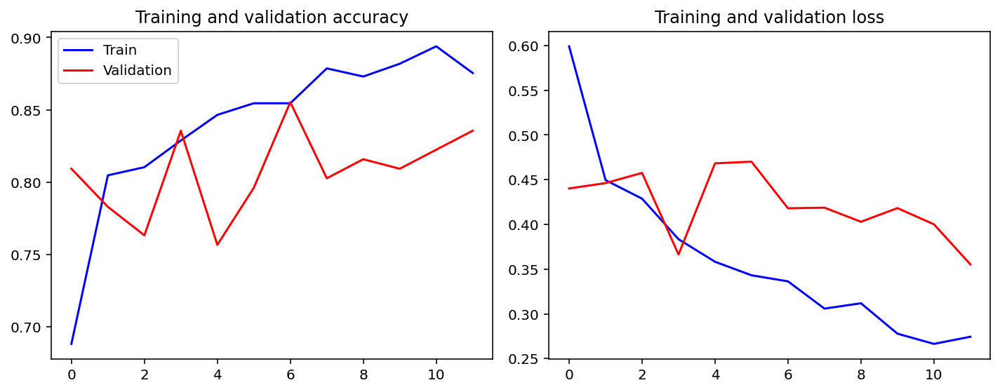

In [ ]:
plot_training(history,model_name)

### 7. Model Prediction

#### restore the model

In [10]:
model_dir = '/content/drive/MyDrive/2021Spring/DL_project/Saved_model/'
model_name = 'InceptionV3_zoomhigh2_zoomlow3_multiscale_model'
model = tf.keras.models.load_model(model_dir+model_name)

#### use slide window to create patches from test set

In [11]:
def predict_row_patches(zoom_high_images, zoom_low_images, zoom_high_masks, trained_model, patch_shape = 299, 
                        normal_less_tissue = True):
  """
  To predict the labels for a row of pathes. 

  Inputs: 
  
  Along one row, we collect N patches for level 1 & level 2 respectively. 
  zoom_high_images: One row of the patches at zoome level 1 (high resolution), shape = (N, patch_shape, patch_shape, 3).
  zoom_low_images:  One row of the patches at zoome level 2 (low resolution), shape = (N, patch_shape, patch_shape, 3).
  zoom_high_masks:  One row of the masks at zoom level 1 (high resolution), shape = (N, patch_shape, patch_shape)
  trained_model: the trained model for classification

  Outputs:
  prediction: The predicted labels for one row patches, shape = (N,)
  true_result: The true labels for one row patches, shape = (N,)
  reference: https://github.com/YC-Coder-Chen/Detecting-Cancer-on-Gigapixel-Images

  """
  
  true_result = list(map(lambda x: int(center_tumor_check(x, center_size = 128, patch_shape = 299)), zoom_high_masks))
  true_result = np.array(true_result)

  prediction = trained_model.predict([zoom_low_images, zoom_high_images]).reshape(zoom_high_images.shape[0],)

  # if the patch has less than 30% tissue, the prediction is directly contrained to "normal cell"
  if normal_less_tissue: 

    for idx in range(len(prediction)):

      if get_tissue_percentage(zoom_high_images[idx])<=0.3:
        prediction[idx] = 0

  return prediction, true_result

Extract and classify the patches using slide window method on one selected slide

reference: https://github.com/YC-Coder-Chen/Detecting-Cancer-on-Gigapixel-Images

In [106]:
slide_path = 'tumor_101.tif'
mask_path  = 'tumor_101_mask.tif'
zoom_level_high = 2
zoom_level_low = 3
patch_shape = 299

slide       = open_slide(input_dir+slide_path)
mask_slide  = open_slide(input_dir+mask_path)

zoom_level1_factor = slide.level_downsamples[zoom_level_high] # high resolution
zoom_level2_factor = slide.level_downsamples[zoom_level_low] # low resolution

width, height = slide.level_dimensions[zoom_level_high]

n_width = int((width - patch_shape * zoom_level2_factor) // (patch_shape))
n_height = int((height - patch_shape * zoom_level2_factor) // (patch_shape))

# have to predict rows by rows or RAM explored
prediction = np.zeros((n_width, n_height)).astype(float)
actual     = np.zeros((n_width, n_height)).astype(int)


for i in range(n_width):
  
  image_zoom_high = []
  image_zoom_low = []
  masks = []

  for j in range(n_height):
    x = (patch_shape // 2 * zoom_level2_factor) + i * patch_shape * zoom_level1_factor
    y = (patch_shape // 2 * zoom_level2_factor) + j * patch_shape * zoom_level1_factor
    
    patch_image_high, patch_mask_high = get_patch(slide, mask_slide, x, y, zoom_level_high, patch_shape) # high resolution
    patch_image_low, patch_mask_low = get_patch(slide, mask_slide, x, y, zoom_level_low, patch_shape) # low resolution
    

    patch_image_high = patch_image_high/255.
    patch_image_low  = patch_image_low/255.

    image_zoom_high.append(patch_image_high)
    image_zoom_low.append(patch_image_low)
    masks.append(patch_mask_high) 

  if (i+1)%20 == 0: 
    print(f"{i+1} columns completed (totally {n_width})")  

  image_zoom_high = np.array(image_zoom_high)
  image_zoom_low = np.array(image_zoom_low)   
  prediction[i,:], actual[i,:] = predict_row_patches(image_zoom_high, image_zoom_low, masks, model, 
                                                     patch_shape = 299,  normal_less_tissue = True)
  
  pred_labels, true_labels = prediction.T, actual.T

Finished 20 / 70
Finished 40 / 70
Finished 60 / 70


Save the generated labels to npy file

In [100]:
def save_labels_npy(pred_labels, true_labels,slide_ID,model_name):
  
  np.save('/content/drive/MyDrive/2021Spring/DL_project/heatmap_npy/'+
          f'pred_label_{slide_ID}_' + model_name + '.npy', pred_labels)
  np.save('/content/drive/MyDrive/2021Spring/DL_project/heatmap_npy/'+
          f'true_label_{slide_ID}_' + model_name + '.npy', true_labels)

In [104]:
save_labels_npy(pred_labels, true_labels,slide_ID=91,model_name='multi_scale')

In [107]:
save_labels_npy(pred_labels, true_labels,slide_ID=78,model_name='multi_scale')

Finally, we plot the heatmap based on the generated labels

In [67]:
def generate_heatmap(true_labels, pred_labels, showing_zoom_level,slide_ID,threshold = 0.4):

  true_labels = true_labels.astype(float)

  # 1. resize the true labels & predicted labels
  factor_show = slide.level_downsamples[showing_zoom_level]


  resized_true = cv2.resize(true_labels, (int(num_patch_width*patch_size*zoom_level1_factor//factor_show), 
                                        int(num_patch_height*patch_size*zoom_level1_factor//factor_show)))
  resized_pred = cv2.resize(pred_labels, (int(num_patch_width*patch_size*zoom_level1_factor//factor_show), 
                                        int(num_patch_height*patch_size*zoom_level1_factor//factor_show)))

  # 2. generate heatmap
  (W_show, H_show) = slide.level_dimensions[showing_zoom_level]

  true_heatmap = np.zeros((H_show, W_show))
  pred_heatmap = np.zeros((H_show, W_show))

  margin = int(patch_size*(zoom_level2_factor-zoom_level1_factor)/2//factor_show)
  true_heatmap[margin:margin+int(num_patch_height*patch_size*zoom_level1_factor//factor_show), 
              margin:margin+int(num_patch_width*patch_size*zoom_level1_factor//factor_show)] = resized_true
  pred_heatmap[margin:margin+int(num_patch_height*patch_size*zoom_level1_factor//factor_show), 
              margin:margin+int(num_patch_width*patch_size*zoom_level1_factor//factor_show)] = resized_pred


  # 3. read the original image & mask 
  slide_image = read_slide(slide, 
                            x=0, 
                            y=0, 
                            level=showing_zoom_level, 
                            width=slide.level_dimensions[showing_zoom_level][0], 
                            height=slide.level_dimensions[showing_zoom_level][1])
  mask_image = read_slide(mask_slide,
                          x=0, 
                          y=0, 
                          level=showing_zoom_level, 
                          width=mask_slide.level_dimensions[showing_zoom_level][0], 
                          height=mask_slide.level_dimensions[showing_zoom_level][1])[:,:,0]

  # 4. plot the heatmap
  fig, axes = plt.subplots(figsize=(10,5),ncols=2)
  pred_mask = (pred_heatmap > threshold).astype(int)

  axes[0].imshow(slide_image)
  axes[0].imshow(pred_mask, cmap='jet', alpha=0.5)

  axes[1].imshow(slide_image)
  axes[1].imshow(true_heatmap, cmap='jet', alpha=0.5)
  axes[1].imshow(mask_image, cmap='jet', alpha=0.5)

  axes[0].set_title(f'The predicted heatmap of slide {slide_ID}')
  axes[1].set_title(f'The true heatmap of slide {slide_ID}')

  plt.tight_layout()
  plt.rcParams['savefig.dpi'] = 310
  plt.savefig(f'/content/drive/MyDrive/2021Spring/DL_project/Figures/heatmap_{slide_ID}_threshold_{threshold}.jpg')



  # 5. report other evaluation metrics
  (fpr, tpr, thresholds) = roc_curve(true_labels.flatten(), pred_labels.flatten())
  AUC_area = auc(fpr,tpr)
  
  precision = precision_score(true_labels.flatten(), (pred_labels.flatten()>threshold).astype(int))
  recall    = recall_score(true_labels.flatten(), (pred_labels.flatten()>threshold).astype(int))
  f1        = f1_score(true_labels.flatten(), (pred_labels.flatten()>threshold).astype(int))

  print(f"AUC: {AUC_area} \nPrecision: {precision}\nRecall: {recall} \nF1 score: {f1}")

AUC: 0.9507642736453299 
Precision: 0.4367816091954023
Recall: 0.7450980392156863 
F1 score: 0.5507246376811594


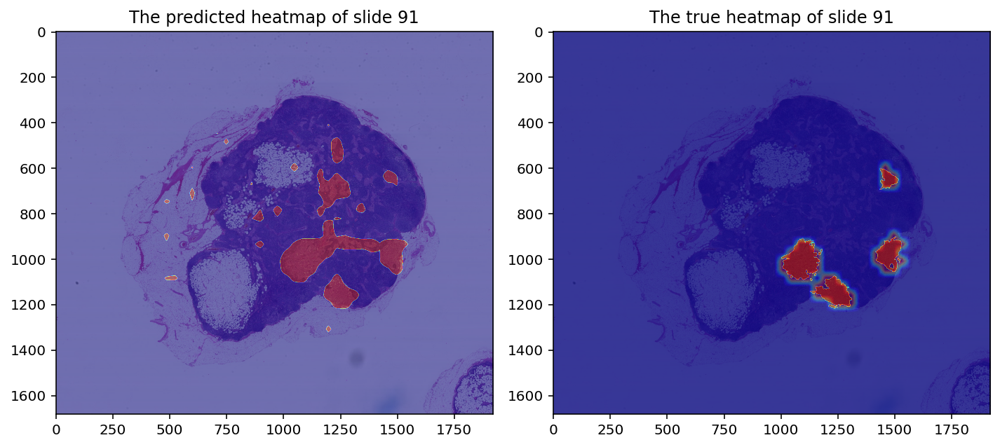

In [102]:
generate_heatmap(true_labels=true_labels, pred_labels=pred_labels, 
                 showing_zoom_level=5,
                 slide_ID=91,threshold = 0.4)

AUC: 0.9810819263111826 
Precision: 0.9424364123159303
Recall: 0.8064146620847652 
F1 score: 0.8691358024691358


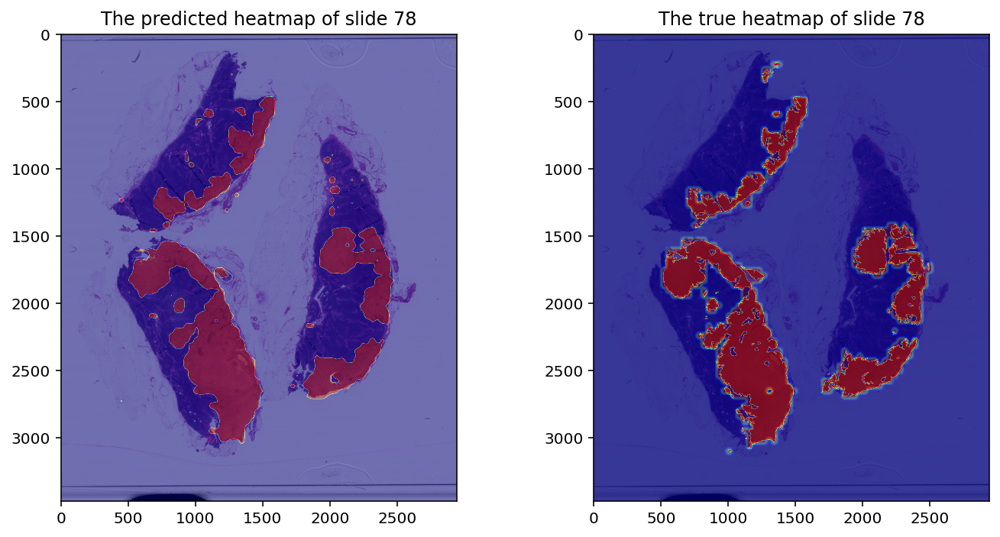

In [108]:
generate_heatmap(true_labels=true_labels, pred_labels=pred_labels, 
                 showing_zoom_level=5,
                 slide_ID=78,threshold = 0.4)